<a href="https://www.kaggle.com/code/dheerajkr1a1a/shimla-retail-prices-forecast?scriptVersionId=152595757" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

**Shimla Retail Prices Forecast**

---


1.   Why only Shimla?
2.   Objective
3.   Importing Libraries 
4.   Data Checks
5.   Visualization
6.   Data Preprocessing
7.   Model Training
8.   Hyperparameter Tuning
9.   Conclusion and Solution









# Why only Shimla?
It is the city with largest datasize across all centres. 

Source: https://www.kaggle.com/dheerajkr1a1a/potato-centre-wise-data-analysis

# Objective
The goal is to utilize the prophet multivariate time series model to forecast the spot prices of potatoes at the Shimla centre, incorporating both macroeconomic and climate-related variables.

# Importing Libraries

In [314]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import cufflinks as cf
import plotly.graph_objects as go
import plotly.io as pio
pio.templates.default='plotly_white'
import os
# import plotly.io as pio
# pio.renderers.default = 'colab'
import seaborn as sns
import plotly.express as px
from prophet import Prophet
from sklearn.metrics import mean_absolute_error, r2_score,mean_absolute_percentage_error
from sklearn.model_selection import train_test_split
from prophet.plot import plot_cross_validation_metric
from prophet.diagnostics import performance_metrics
from prophet.diagnostics import cross_validation
#from sklearn.linear_model import LinearRegression
from plotly.subplots import make_subplots
import itertools
%matplotlib inline
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
cf.go_offline()

# Reading & plotting complete data for Shimla Centre

In [315]:
parent_df={}
parent_df['RANCHI']=pd.read_csv('/kaggle/input/shimla-potato-retail-prices-analysis/complete_data.csv',index_col=0,parse_dates=[0])

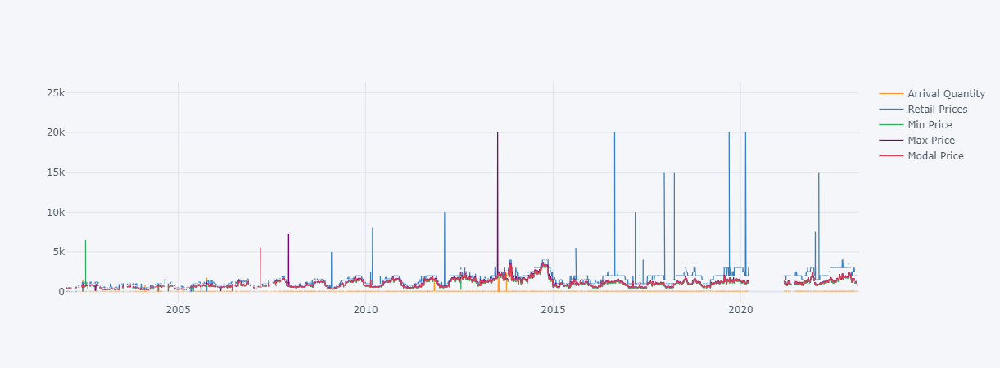

In [316]:
# sns.lineplot(data=parent_df['RANCHI'])
parent_df['RANCHI'].iplot()

# Plotting only Retail Prices & Arrival Quantity

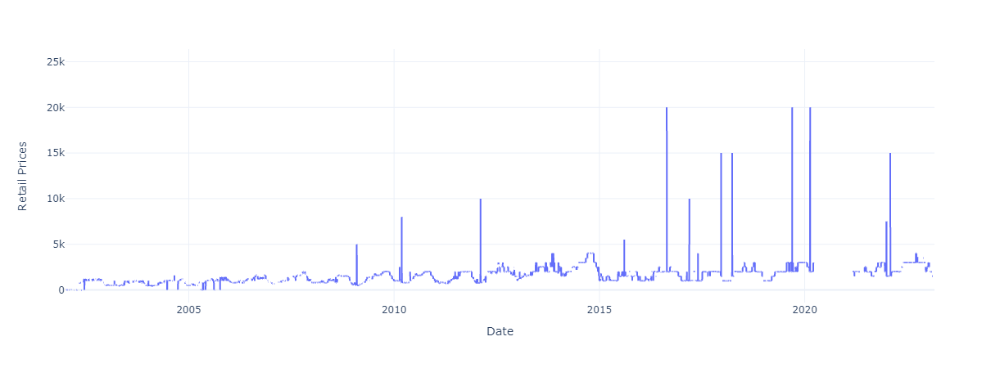

In [317]:
px.line(parent_df['RANCHI'],x=parent_df['RANCHI'].index,y='Retail Prices')

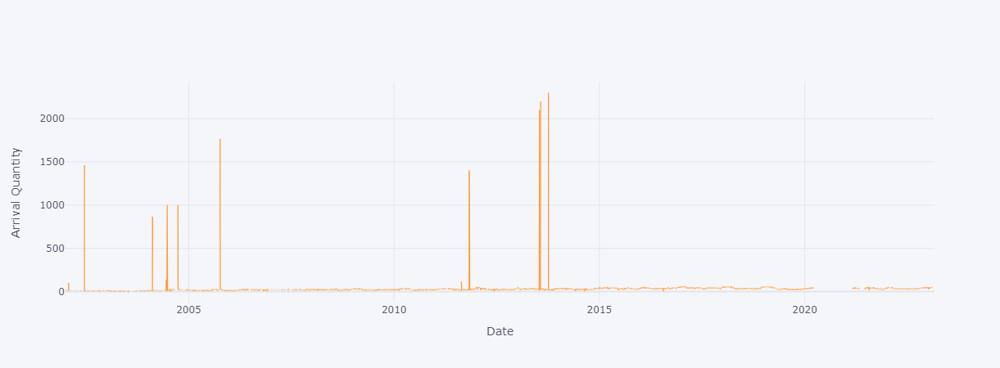

In [318]:
parent_df['RANCHI']['Arrival Quantity'].iplot(xTitle='Date',yTitle='Arrival Quantity')

# Dropping the outliers with Retail Prices less than threshold set for keeping the data
**For example here 4000 is the threshold and 27th may 2017(value=4000) being the local outliers will not be dropped.**

In [319]:
parent_df['RANCHI'].drop('2017-05-27',inplace=True)

In [320]:
parent_df['RANCHI']

,Arrival Quantity,Retail Prices,Min Price,Max Price,Modal Price
Date,,,,,
2002-01-01,NaN,NaN,NaN,NaN,NaN
2002-01-02,NaN,NaN,NaN,NaN,NaN
2002-01-03,NaN,NaN,NaN,NaN,NaN
2002-01-04,12.0,0.0,400.0,450.0,425.0
2002-01-05,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...
2023-02-27,NaN,NaN,NaN,NaN,NaN
2023-02-28,NaN,NaN,NaN,NaN,NaN
2023-02-28,NaN,NaN,NaN,NaN,NaN


# Looking for the changes

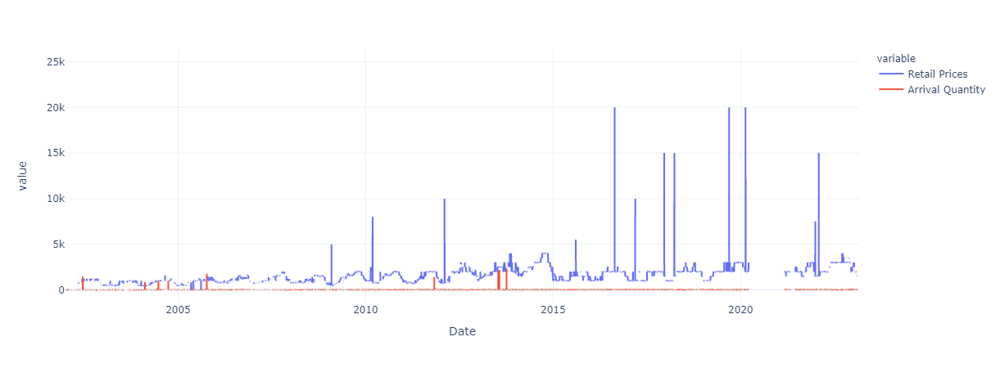

In [321]:
px.line(parent_df['RANCHI'],x=parent_df['RANCHI'].index,y=['Retail Prices','Arrival Quantity'])

# Plotting Arrival Quantity

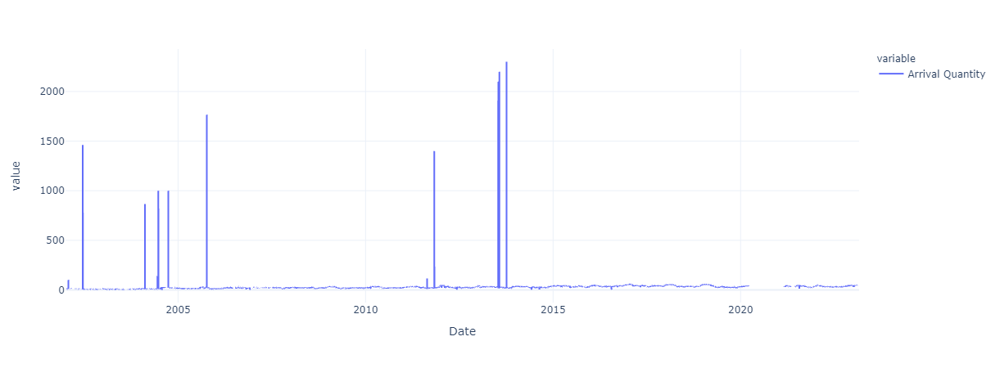

In [322]:
px.line(parent_df['RANCHI'],x=parent_df['RANCHI'].index,y=['Arrival Quantity'])

# Filling null with -1 to prevent them from being lost when applying condition of dropping outliers

In [323]:
parent_df['RANCHI']['Arrival Quantity'].fillna(-1,inplace=True)

In [324]:
parent_df['RANCHI'].info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 7532 entries, 2002-01-01 to 2023-02-28
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Arrival Quantity  7532 non-null   float64
 1   Retail Prices     5314 non-null   float64
 2   Min Price         5314 non-null   float64
 3   Max Price         5314 non-null   float64
 4   Modal Price       5314 non-null   float64
dtypes: float64(5)
memory usage: 353.1 KB


# Condition of dropping outliers

In [325]:
parent_df['RANCHI']=parent_df['RANCHI'][parent_df['RANCHI']['Arrival Quantity']<=60]


In [326]:
parent_df['RANCHI'].info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 7519 entries, 2002-01-01 to 2023-02-28
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Arrival Quantity  7519 non-null   float64
 1   Retail Prices     5301 non-null   float64
 2   Min Price         5301 non-null   float64
 3   Max Price         5301 non-null   float64
 4   Modal Price       5301 non-null   float64
dtypes: float64(5)
memory usage: 352.5 KB


# Arrival qty without outliers

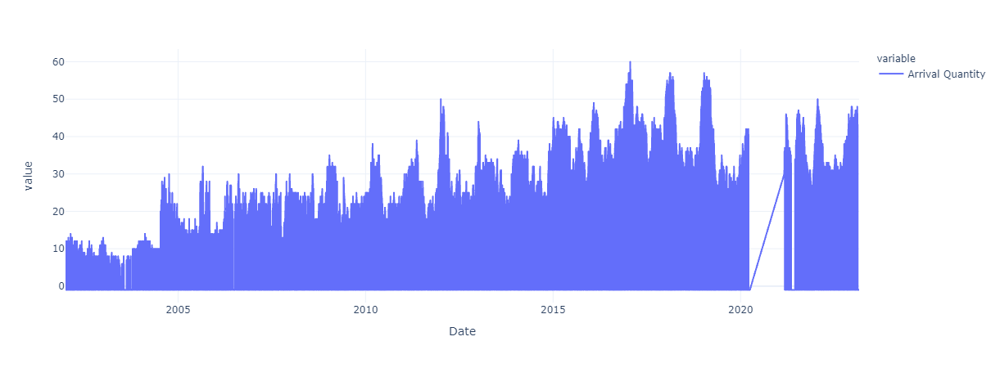

In [327]:
px.line(parent_df['RANCHI'],x=parent_df['RANCHI'].index,y=['Arrival Quantity'])

# Getting back the null values for easier analysis

In [328]:
parent_df['RANCHI']['Arrival Quantity'].replace(-1,np.nan,inplace=True)

In [329]:
parent_df['RANCHI'].info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 7519 entries, 2002-01-01 to 2023-02-28
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Arrival Quantity  5301 non-null   float64
 1   Retail Prices     5301 non-null   float64
 2   Min Price         5301 non-null   float64
 3   Max Price         5301 non-null   float64
 4   Modal Price       5301 non-null   float64
dtypes: float64(5)
memory usage: 352.5 KB


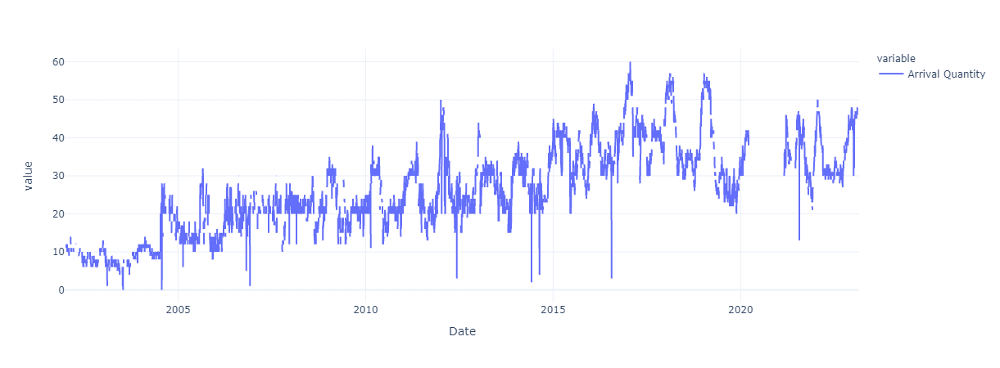

In [330]:
px.line(parent_df['RANCHI'],x=parent_df['RANCHI'].index,y=['Arrival Quantity'])

In [331]:
parent_df['RANCHI'].describe()

,Arrival Quantity,Retail Prices,Min Price,Max Price,Modal Price
count,5301.000000,5301.000000,5301.000000,5301.000000,5301.000000
mean,27.215808,1603.584229,960.765516,1090.517261,1024.325788
std,11.290145,1006.189515,515.421804,612.297116,531.779741
min,0.000000,0.000000,200.000000,50.000000,52.000000
25%,20.000000,1000.000000,550.000000,650.000000,600.000000
50%,27.000000,1500.000000,900.000000,1000.000000,950.000000
75%,35.000000,2000.000000,1200.000000,1400.000000,1300.000000
max,60.000000,25000.000000,6500.000000,20000.000000,5550.000000


# Filling null with 1000 to prevent them from being lost when applying condition of dropping downward outliers

In [332]:
parent_df['RANCHI']['Arrival Quantity'].fillna(1000,inplace=True)

In [333]:
parent_df['RANCHI'].info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 7519 entries, 2002-01-01 to 2023-02-28
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Arrival Quantity  7519 non-null   float64
 1   Retail Prices     5301 non-null   float64
 2   Min Price         5301 non-null   float64
 3   Max Price         5301 non-null   float64
 4   Modal Price       5301 non-null   float64
dtypes: float64(5)
memory usage: 352.5 KB


# Condition of dropping downward outliers

In [334]:
parent_df['RANCHI']=parent_df['RANCHI'][(parent_df['RANCHI']['Arrival Quantity']>=11)]

In [335]:
parent_df['RANCHI'].info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 7087 entries, 2002-01-01 to 2023-02-28
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Arrival Quantity  7087 non-null   float64
 1   Retail Prices     4869 non-null   float64
 2   Min Price         4869 non-null   float64
 3   Max Price         4869 non-null   float64
 4   Modal Price       4869 non-null   float64
dtypes: float64(5)
memory usage: 332.2 KB


# Getting back the null values for easier analysis

In [336]:
parent_df['RANCHI']['Arrival Quantity'].replace(1000,np.nan,inplace=True)

In [337]:
parent_df['RANCHI'].info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 7087 entries, 2002-01-01 to 2023-02-28
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Arrival Quantity  4869 non-null   float64
 1   Retail Prices     4869 non-null   float64
 2   Min Price         4869 non-null   float64
 3   Max Price         4869 non-null   float64
 4   Modal Price       4869 non-null   float64
dtypes: float64(5)
memory usage: 332.2 KB


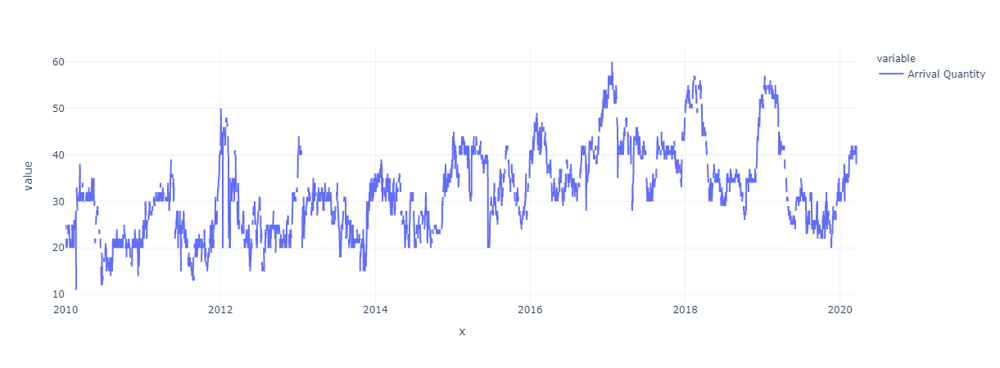

In [338]:
px.line(parent_df['RANCHI'].loc['2010':'2020',],x=parent_df['RANCHI'].loc['2010':'2020',].index,y=['Arrival Quantity'])

# Considering '2010-02-20' as local outlier.

In [339]:
parent_df['RANCHI'].drop('2010-02-20',inplace=True)

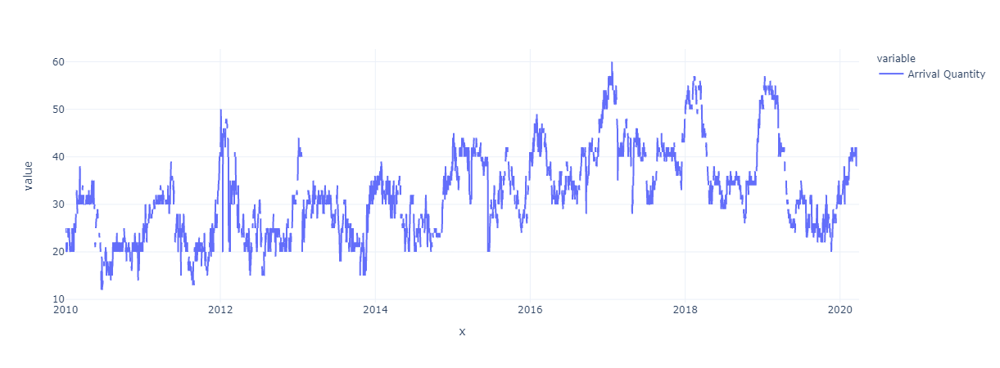

In [340]:
px.line(parent_df['RANCHI'].loc['2010':'2020',],x=parent_df['RANCHI'].loc['2010':'2020',].index,y=['Arrival Quantity'])

<Axes: >

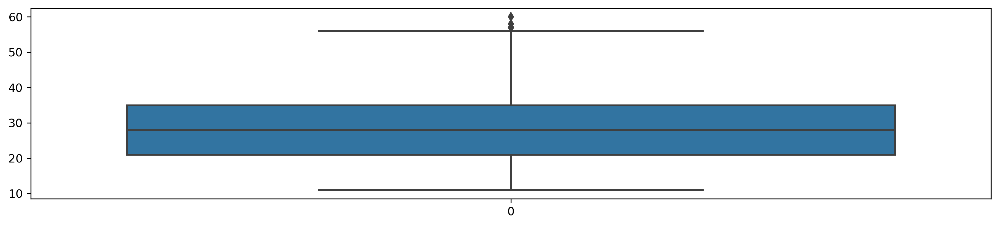

In [341]:
sns.boxplot(data=parent_df['RANCHI']['Arrival Quantity'])

In [342]:
parent_df['RANCHI'].loc[:,'Arrival Quantity'].describe()

count    4868.000000
mean       28.919269
std        10.147153
min        11.000000
25%        21.000000
50%        28.000000
75%        35.000000
max        60.000000
Name: Arrival Quantity, dtype: float64

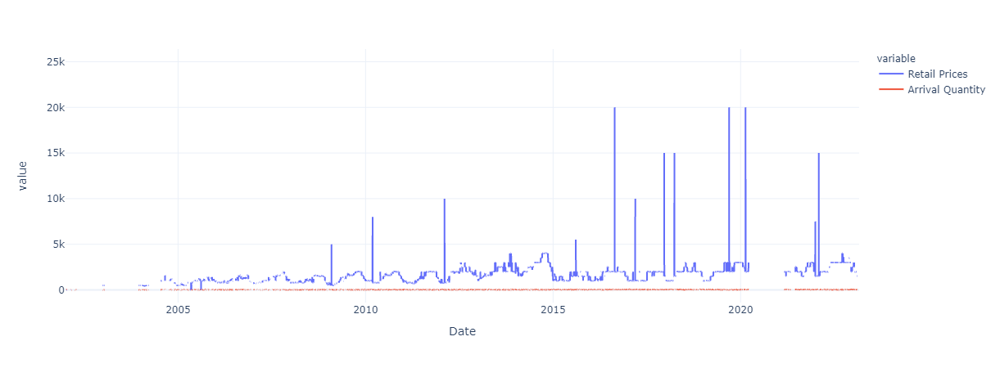

In [343]:
px.line(parent_df['RANCHI'],x=parent_df['RANCHI'].index,y=['Retail Prices','Arrival Quantity'])

In [344]:
df_Ranchi=parent_df['RANCHI'].copy()

In [345]:
df_Ranchi.loc[:,'Retail Prices'][(df_Ranchi['Retail Prices']>4000) & (df_Ranchi['Retail Prices']<5000)].head(60)

Series([], Name: Retail Prices, dtype: float64)

In [346]:
df_Ranchi['2011':'2012'].describe()

,Arrival Quantity,Retail Prices,Min Price,Max Price,Modal Price
count,579.000000,579.000000,579.000000,579.000000,579.000000
mean,26.000000,1555.958549,1054.274611,1207.849741,1133.385147
std,6.801944,671.370729,484.292720,520.402256,502.899577
min,13.000000,700.000000,200.000000,450.000000,425.000000
25%,21.000000,1000.000000,512.500000,625.000000,575.000000
50%,25.000000,1600.000000,1200.000000,1400.000000,1300.000000
75%,30.000000,2000.000000,1500.000000,1600.000000,1550.000000
max,50.000000,10000.000000,2200.000000,2500.000000,2400.000000


# Visualising the data with outliers 

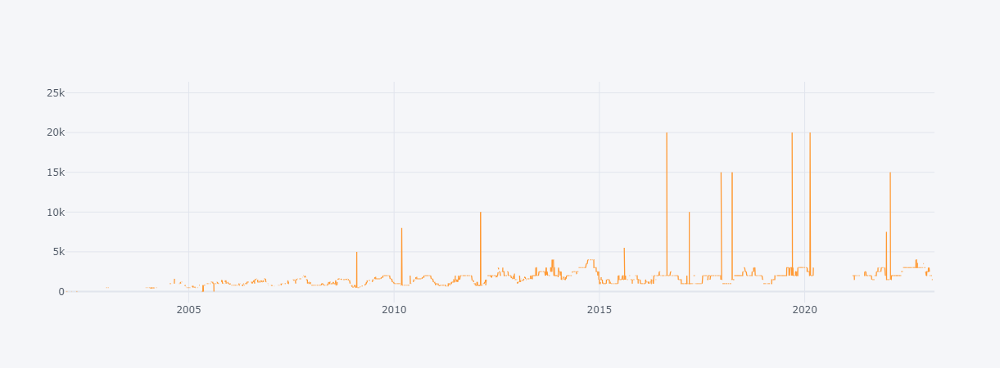

In [347]:
df_Ranchi['Retail Prices'].iplot()

# Creating cleaned copy of data for ACF plots and adf test 

In [348]:
df_Ranchi_1=df_Ranchi.copy()
df_Ranchi.isnull().sum()

Arrival Quantity    2218
Retail Prices       2218
Min Price           2218
Max Price           2218
Modal Price         2218
dtype: int64

# Dropping Retail Prices Outliers

In [349]:
# https://www.ceicdata.com/en/india/retail-price-department-of-agriculture-and-cooperation-food-by-cities-tomato/retail-price-doac-tomato-jharkhand-ranchi
# above is the source provided to prove that 18k price is an outlier

df_Ranchi_1=df_Ranchi_1[df_Ranchi_1['Retail Prices']<=4000]
df_Ranchi_1.isnull().sum()
# df_Ranchi['Retail Prices'].iplot()

Arrival Quantity    0
Retail Prices       0
Min Price           0
Max Price           0
Modal Price         0
dtype: int64

In [350]:
df_Ranchi=df_Ranchi['2010':'2020'].copy()

In [351]:
df_Ranchi_1=df_Ranchi_1['2010':'2020'].copy()
df_Ranchi_1.isnull().sum()

Arrival Quantity    0
Retail Prices       0
Min Price           0
Max Price           0
Modal Price         0
dtype: int64

In [352]:
df_Ranchi_dropped=df_Ranchi_1.dropna()

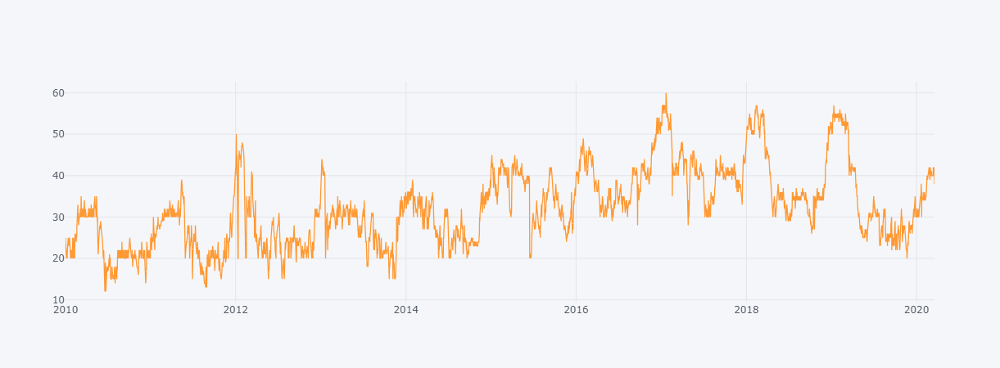

In [353]:
df_Ranchi_dropped['Arrival Quantity'].iplot()

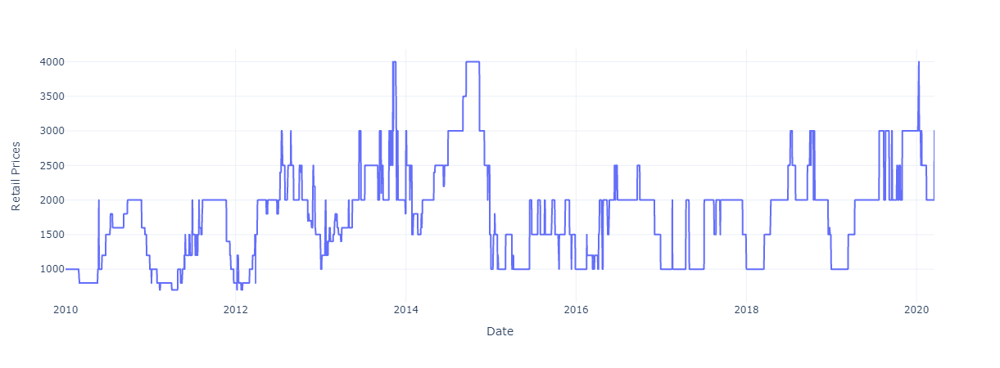

In [354]:
px.line(df_Ranchi_dropped,x=df_Ranchi_dropped.index,y='Retail Prices')

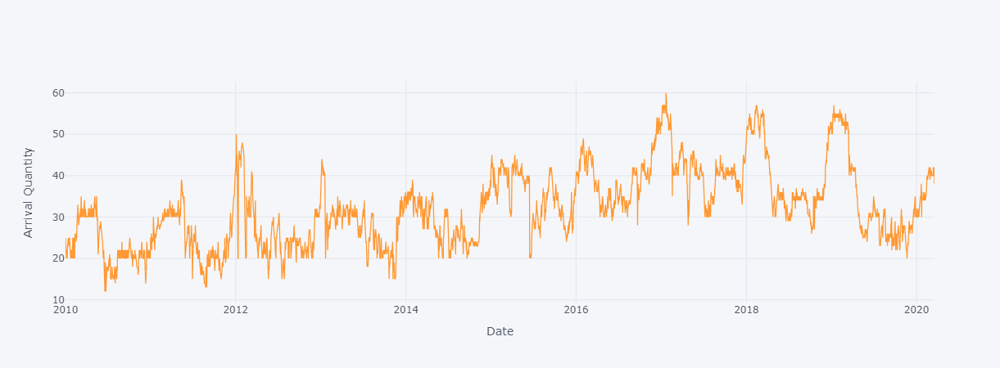

In [355]:
df_Ranchi_dropped['Arrival Quantity'].iplot(xTitle='Date',yTitle='Arrival Quantity')

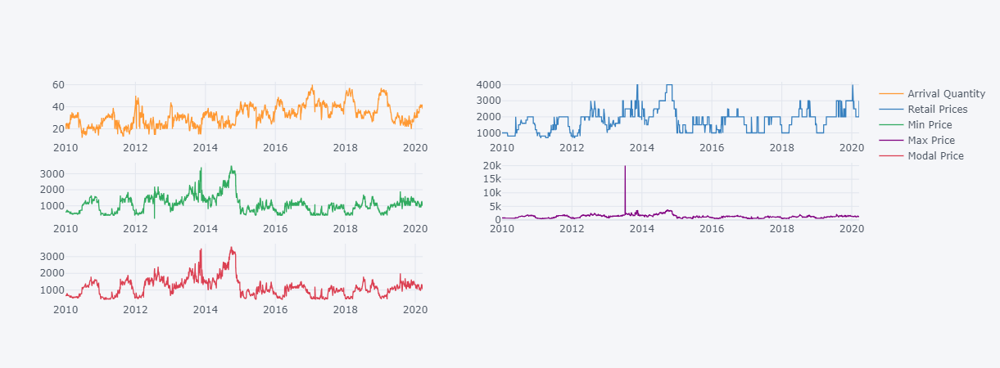

In [356]:
df_Ranchi_dropped.iplot(subplots=True)

<Axes: xlabel='Lag', ylabel='Autocorrelation'>

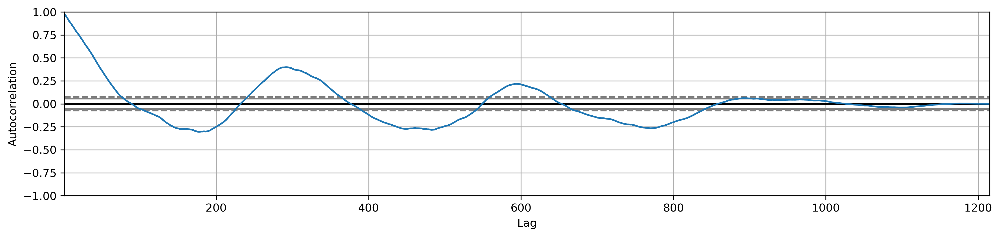

In [357]:
pd.plotting.autocorrelation_plot(df_Ranchi_dropped['2016':'2020']['Arrival Quantity'])

<Axes: xlabel='Lag', ylabel='Autocorrelation'>

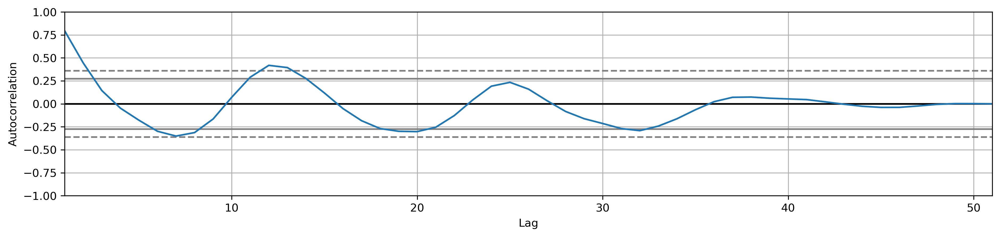

In [358]:
pd.plotting.autocorrelation_plot(df_Ranchi_dropped['2016':'2020']['Arrival Quantity'].resample('1m').mean())

<Axes: xlabel='Lag', ylabel='Autocorrelation'>

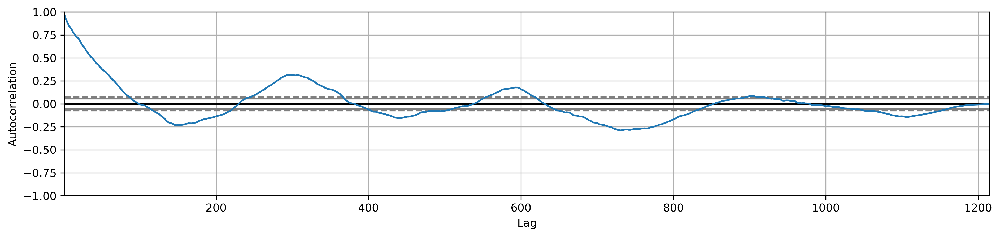

In [359]:
pd.plotting.autocorrelation_plot(df_Ranchi_dropped['2016':'2020']['Retail Prices'])

<Axes: xlabel='Lag', ylabel='Autocorrelation'>

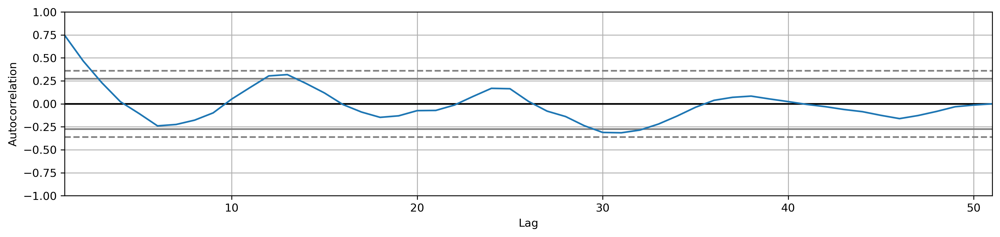

In [360]:
pd.plotting.autocorrelation_plot(df_Ranchi_dropped['2016':'2020']['Retail Prices'].resample('1m').mean())

<Axes: xlabel='y(t)', ylabel='y(t + 3)'>

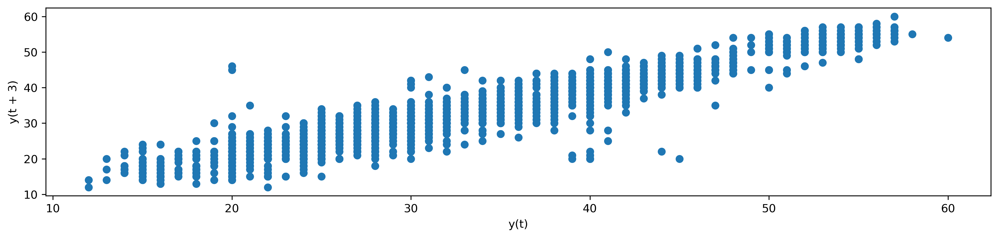

In [361]:
pd.plotting.lag_plot(df_Ranchi_1['Arrival Quantity'],lag=3)

<Axes: xlabel='y(t)', ylabel='y(t + 13)'>

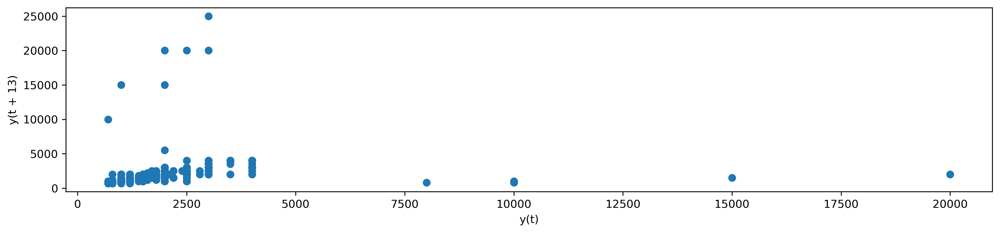

In [362]:
pd.plotting.lag_plot(df_Ranchi['Retail Prices'],lag=13)

In [363]:
from statsmodels.tsa.stattools import adfuller


# In[19]:


test_result=adfuller(df_Ranchi_dropped['Arrival Quantity'])


# In[20]:


#Ho: It is non stationary
#H1: It is stationary

def adfuller_test(sales):
    result=adfuller(sales)
    labels = ['ADF Test Statistic','p-value','#Lags Used','Number of Observations Used']
    for value,label in zip(result,labels):
        print(label+' : '+str(value) )
    if result[1] <= 0.05:
        print("strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary")
    else:
        print("weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary ")


In [364]:
adfuller_test(df_Ranchi_dropped['Arrival Quantity'])

ADF Test Statistic : -4.724277356180965
p-value : 7.574610425181206e-05
#Lags Used : 3
Number of Observations Used : 2924
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary


In [365]:
adfuller_test(df_Ranchi_dropped['Retail Prices'])

ADF Test Statistic : -3.865161947738124
p-value : 0.002306733005351516
#Lags Used : 13
Number of Observations Used : 2914
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary


# Applying similar procedure to drop outliers without losing NULL

In [366]:
df_Ranchi['Retail Prices']=df_Ranchi['Retail Prices'].fillna(-1)
df_Ranchi=df_Ranchi[(df_Ranchi['Retail Prices']<=4000)]
df_Ranchi.replace(-1,np.nan,inplace=True)

# Imputing with rolling window size = adf lags

In [367]:
df_Ranchi

,Arrival Quantity,Retail Prices,Min Price,Max Price,Modal Price
Date,,,,,
2010-01-01,25.0,1000.0,650.0,750.0,700.0
2010-01-02,24.0,1000.0,600.0,700.0,650.0
2010-01-03,NaN,NaN,NaN,NaN,NaN
2010-01-04,22.0,1000.0,650.0,750.0,700.0
2010-01-05,20.0,1000.0,600.0,700.0,650.0
...,...,...,...,...,...
2020-03-27,NaN,NaN,NaN,NaN,NaN
2020-03-28,NaN,NaN,NaN,NaN,NaN
2020-03-29,NaN,NaN,NaN,NaN,NaN


In [368]:
df_Ranchi.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 3792 entries, 2010-01-01 to 2020-03-31
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Arrival Quantity  2928 non-null   float64
 1   Retail Prices     2928 non-null   float64
 2   Min Price         2928 non-null   float64
 3   Max Price         2928 non-null   float64
 4   Modal Price       2928 non-null   float64
dtypes: float64(5)
memory usage: 177.8 KB


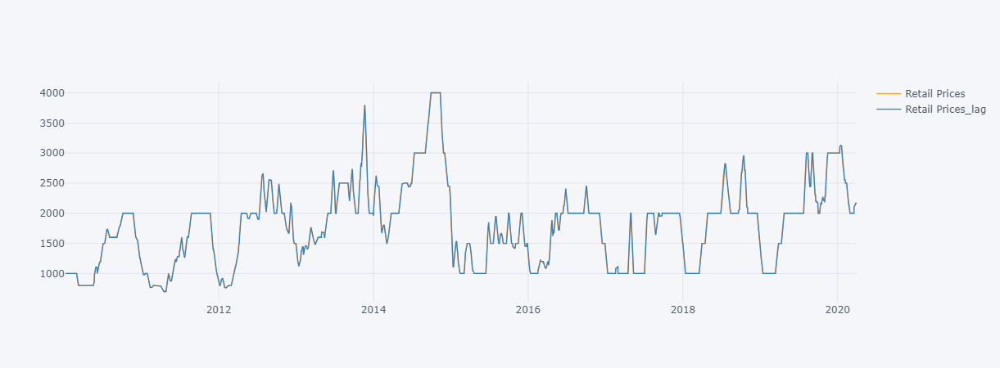

Retail Prices        0
Arrival Quantity     0
Retail Prices_lag    0
dtype: int64

In [369]:
df_Ranchi_imp=pd.DataFrame()
df_Ranchi_imp['Retail Prices']=df_Ranchi['Retail Prices'].rolling(window=13,min_periods=6).mean().fillna(method='ffill')
df_Ranchi_imp['Arrival Quantity']=df_Ranchi['Arrival Quantity'].rolling(window=3,min_periods=1).mean().fillna(method='ffill')
df_Ranchi_imp['Retail Prices_lag']=df_Ranchi['Retail Prices'].rolling(window=13,min_periods=6).mean().fillna(method='ffill').shift(1)
# df_Ranchi_imp['Arrival Quantity']=df_Ranchi['Arrival Quantity'].rolling(window=5,min_periods=2).mean().fillna(method='bfill')
df_Ranchi_imp=df_Ranchi_imp.dropna()
#df_Ranchi_imp['2008':'2016']['Retail Prices'].plot()
df_Ranchi_imp[['Retail Prices','Retail Prices_lag']].iplot()
df_Ranchi_imp.isnull().sum()

# Resampling daily data into monthly data

In [370]:
df_Ranchi_imp_month=pd.DataFrame()
df_Ranchi_imp_month['Retail Prices_lag']=df_Ranchi_imp['Retail Prices_lag'].resample('M').mean()
df_Ranchi_imp_month['Arrival Quantity']=df_Ranchi_imp['Arrival Quantity'].resample('M').max()
df_Ranchi_imp_month['Arrival Quantity_mean']=df_Ranchi_imp['Arrival Quantity'].resample('M').mean()
df_Ranchi_imp_month=df_Ranchi_imp_month.dropna()
df_Ranchi_imp_month.index = df_Ranchi_imp_month.index + pd.offsets.MonthBegin(0)
df_Ranchi_imp_month[['Arrival Quantity','Retail Prices_lag']].tail(6)

,Arrival Quantity,Retail Prices_lag
Date,,
2019-11-01,31.0,2141.019062
2019-12-01,28.0,2787.218964
2020-01-01,34.5,3000.000000
2020-02-01,36.5,2986.191077
2020-03-01,42.0,2330.008418
2020-04-01,42.0,2061.725550


In [371]:
df_Ranchi_imp_month

,Retail Prices_lag,Arrival Quantity,Arrival Quantity_mean
Date,,,
2010-02-01,1000.000000,25.000000,22.354167
2010-03-01,1000.000000,32.500000,25.722222
2010-04-01,833.333333,33.500000,31.050000
2010-05-01,800.000000,33.000000,30.790323
2010-06-01,859.178886,34.666667,29.349462
...,...,...,...
2019-12-01,2787.218964,28.000000,25.075269
2020-01-01,3000.000000,34.500000,29.489247
2020-02-01,2986.191077,36.500000,32.933333


# Reading csv file (Fertilizer subsidy rates, Diesel Reserves and Diesel Prices) 

In [372]:
df_1_new=pd.read_csv('/kaggle/input/shimla-potato-retail-prices-analysis/Fert_shimla_dies_price.csv',index_col=[0],parse_dates=True)
df_1_new

,N,P,K,S,thousand million barrels,dprice
2010-01-01,23.227,26.276,24.487,1.784,5.800000,38.550835
2010-04-01,23.227,26.276,24.487,1.784,5.766667,38.550835
2010-11-01,23.227,25.950,24.237,1.784,5.733333,38.550835
2011-01-01,23.227,25.624,23.987,1.784,5.700000,39.767325
2011-04-01,27.153,32.338,26.756,1.677,5.700000,40.983816
...,...,...,...,...,...,...
2022-04-01,18.901,15.216,11.124,3.562,4.700000,89.347496
2022-05-01,18.901,15.216,11.124,3.562,4.700000,86.043248
2023-01-01,18.901,15.216,11.124,3.562,4.700000,82.936266
2023-02-01,18.901,15.216,11.124,3.562,4.700000,85.796662


In [373]:
#df_1_new=pd.read_csv('FERTILIZERS.csv',names=['Date','N','P','K','S'],header=0,index_col=[0],parse_dates=True)
finaldf1=df_Ranchi_imp_month[['Arrival Quantity_mean','Retail Prices_lag']].copy()
finaldf1

,Arrival Quantity_mean,Retail Prices_lag
Date,,
2010-02-01,22.354167,1000.000000
2010-03-01,25.722222,1000.000000
2010-04-01,31.050000,833.333333
2010-05-01,30.790323,800.000000
2010-06-01,29.349462,859.178886
...,...,...
2019-12-01,25.075269,2787.218964
2020-01-01,29.489247,3000.000000
2020-02-01,32.933333,2986.191077


# Merging original df with extra features

In [374]:
finaldf1=df_Ranchi_imp_month[['Arrival Quantity_mean','Retail Prices_lag']].copy()
df_concat_1 = pd.concat([finaldf1, df_1_new], axis=1, join='outer')
df_concat_1.loc[:,['N','P','K','S','thousand million barrels','dprice']]=df_concat_1.loc[:,['N','P','K','S','thousand million barrels','dprice']].interpolate().fillna(method='bfill')
df_concat_1.dropna(subset=['Arrival Quantity_mean','Retail Prices_lag'],inplace=True)
df_concat_1.head()

,Arrival Quantity_mean,Retail Prices_lag,N,P,K,S,thousand million barrels,dprice
2010-02-01,22.354167,1000.000000,23.227,26.276000,24.487000,1.784,5.788889,38.550835
2010-03-01,25.722222,1000.000000,23.227,26.276000,24.487000,1.784,5.777778,38.550835
2010-04-01,31.050000,833.333333,23.227,26.276000,24.487000,1.784,5.766667,38.550835
2010-05-01,30.790323,800.000000,23.227,26.229429,24.451286,1.784,5.761905,38.550835
2010-06-01,29.349462,859.178886,23.227,26.182857,24.415571,1.784,5.757143,38.550835


# Creating meaningful features like NBS rates using N,P,K 

In [375]:
df_concat_1['NBS rate']=df_concat_1['N']+1*df_concat_1['P']+2*df_concat_1['K']
df_concat_1=df_concat_1.loc[:,['Arrival Quantity_mean','Retail Prices_lag','NBS rate','thousand million barrels','dprice']]
df_concat_1

,Arrival Quantity_mean,Retail Prices_lag,NBS rate,thousand million barrels,dprice
2010-02-01,22.354167,1000.000000,98.477,5.788889,38.550835
2010-03-01,25.722222,1000.000000,98.477,5.777778,38.550835
2010-04-01,31.050000,833.333333,98.477,5.766667,38.550835
2010-05-01,30.790323,800.000000,98.359,5.761905,38.550835
2010-06-01,29.349462,859.178886,98.241,5.757143,38.550835
...,...,...,...,...,...
2019-12-01,25.075269,2787.218964,56.365,4.700000,65.576633
2020-01-01,29.489247,3000.000000,56.365,4.700000,66.168439
2020-02-01,32.933333,2986.191077,56.365,4.700000,68.042489
2020-03-01,38.033333,2330.008418,56.365,4.700000,63.702581


# Reading Rainfall data, resampling it using sum attribute and cropping according to original indexes

In [376]:
df_rain=pd.read_csv('/kaggle/input/shimla-potato-retail-prices-analysis/Rainfal_shimla.csv',index_col=[0],parse_dates=True)
df_rain_m=df_rain.resample('MS').sum()
df_rain_m=df_rain_m.loc[df_concat_1.index,:]
df_rain_m

,Rainfall
2010-02-01,73.3
2010-03-01,25.8
2010-04-01,25.5
2010-05-01,56.6
2010-06-01,122.9
...,...
2019-12-01,29.9
2020-01-01,127.6
2020-02-01,19.0
2020-03-01,134.5


# Reading Temp data and cropping according to original indexes

In [377]:
df_temp=pd.read_csv('/kaggle/input/shimla-potato-retail-prices-analysis/Suni_temp_data.csv',index_col=[0],parse_dates=True)
df_temp=df_temp.loc[df_concat_1.index[:-4],['tas']]
df_temp

,tas
2010-02-01,9.100000
2010-03-01,16.000000
2010-04-01,20.500000
2010-05-01,21.700000
2010-06-01,21.400000
...,...
2019-08-01,20.100000
2019-09-01,20.200000
2019-10-01,16.800001
2019-11-01,12.900001


In [378]:
df_concat_1=pd.concat([df_concat_1,df_rain_m,df_temp],axis=1)
df_concat_1

,Arrival Quantity_mean,Retail Prices_lag,NBS rate,thousand million barrels,dprice,Rainfall,tas
2010-02-01,22.354167,1000.000000,98.477,5.788889,38.550835,73.3,9.1
2010-03-01,25.722222,1000.000000,98.477,5.777778,38.550835,25.8,16.0
2010-04-01,31.050000,833.333333,98.477,5.766667,38.550835,25.5,20.5
2010-05-01,30.790323,800.000000,98.359,5.761905,38.550835,56.6,21.7
2010-06-01,29.349462,859.178886,98.241,5.757143,38.550835,122.9,21.4
...,...,...,...,...,...,...,...
2019-12-01,25.075269,2787.218964,56.365,4.700000,65.576633,29.9,7.1
2020-01-01,29.489247,3000.000000,56.365,4.700000,66.168439,127.6,NaN
2020-02-01,32.933333,2986.191077,56.365,4.700000,68.042489,19.0,NaN
2020-03-01,38.033333,2330.008418,56.365,4.700000,63.702581,134.5,NaN


# Merging GDP and CPI onto new dataframe

In [379]:
df_new=pd.read_csv('/kaggle/input/shimla-potato-retail-prices-analysis/gdp and cpi merged.csv',index_col=0,parse_dates=True)
finaldf1=df_concat_1.merge(df_new,on=df_concat_1.index)
finaldf1=finaldf1.iloc[:-4,:]

# Final dataframe with mean (arrival qty)

In [380]:
finaldf1

,key_0,Arrival Quantity_mean,Retail Prices_lag,NBS rate,thousand million barrels,dprice,Rainfall,tas,CPI,GDP
0,2010-02-01,22.354167,1000.000000,98.477,5.788889,38.550835,73.3,9.100000,65.030284,99.41989
1,2010-03-01,25.722222,1000.000000,98.477,5.777778,38.550835,25.8,16.000000,65.030284,99.62147
2,2010-04-01,31.050000,833.333333,98.477,5.766667,38.550835,25.5,20.500000,65.030284,99.81792
3,2010-05-01,30.790323,800.000000,98.359,5.761905,38.550835,56.6,21.700000,65.795346,100.00665
4,2010-06-01,29.349462,859.178886,98.241,5.757143,38.550835,122.9,21.400000,66.560408,100.18442
...,...,...,...,...,...,...,...,...,...,...
114,2019-08-01,30.026882,2052.052786,56.365,4.700000,63.505313,246.3,20.100000,122.409946,100.58100
115,2019-09-01,27.005376,2730.384490,56.365,4.700000,63.949166,78.7,20.200000,123.175008,100.43866
116,2019-10-01,25.416667,2489.090909,56.365,4.700000,64.393020,15.8,16.800001,124.322601,100.27402
117,2019-11-01,26.053763,2141.019062,56.365,4.700000,64.984826,34.6,12.900001,125.470194,100.08812


# Making it ready-to-use for prophet model 

In [381]:
finaldf1['ds'] = pd.to_datetime(finaldf1.key_0)
finaldf1.drop('key_0',axis=1,inplace=True)
finaldf1
finaldf1.rename(columns={'Retail Prices_lag':'y'},inplace=True)
finaldf1.tail()

,Arrival Quantity_mean,y,NBS rate,thousand million barrels,dprice,Rainfall,tas,CPI,GDP,ds
114,30.026882,2052.052786,56.365,4.7,63.505313,246.3,20.100000,122.409946,100.58100,2019-08-01
115,27.005376,2730.384490,56.365,4.7,63.949166,78.7,20.200000,123.175008,100.43866,2019-09-01
116,25.416667,2489.090909,56.365,4.7,64.393020,15.8,16.800001,124.322601,100.27402,2019-10-01
117,26.053763,2141.019062,56.365,4.7,64.984826,34.6,12.900001,125.470194,100.08812,2019-11-01
118,25.075269,2787.218964,56.365,4.7,65.576633,29.9,7.100000,126.235257,99.88208,2019-12-01


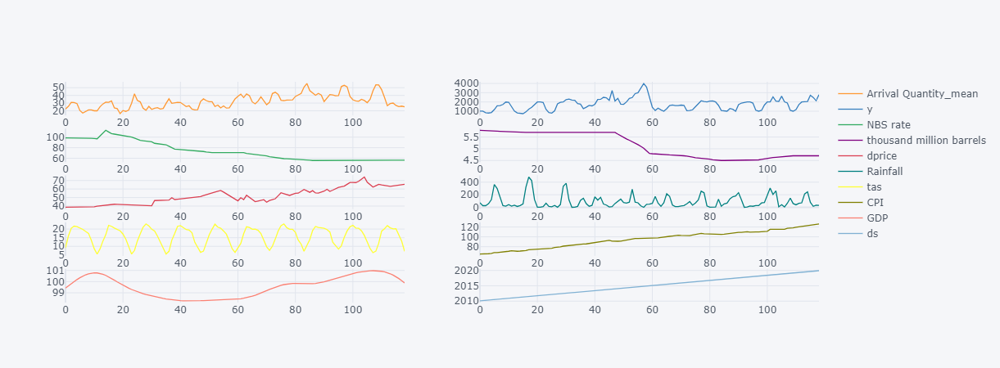

In [382]:
finaldf1.iplot(subplots=True)

# Repeating the same process of concatenation for max (arrival qty)

In [383]:
df_1_new

,N,P,K,S,thousand million barrels,dprice
2010-01-01,23.227,26.276,24.487,1.784,5.800000,38.550835
2010-04-01,23.227,26.276,24.487,1.784,5.766667,38.550835
2010-11-01,23.227,25.950,24.237,1.784,5.733333,38.550835
2011-01-01,23.227,25.624,23.987,1.784,5.700000,39.767325
2011-04-01,27.153,32.338,26.756,1.677,5.700000,40.983816
...,...,...,...,...,...,...
2022-04-01,18.901,15.216,11.124,3.562,4.700000,89.347496
2022-05-01,18.901,15.216,11.124,3.562,4.700000,86.043248
2023-01-01,18.901,15.216,11.124,3.562,4.700000,82.936266
2023-02-01,18.901,15.216,11.124,3.562,4.700000,85.796662


In [384]:
df_Ranchi_imp_month[['Arrival Quantity','Retail Prices_lag']]

,Arrival Quantity,Retail Prices_lag
Date,,
2010-02-01,25.000000,1000.000000
2010-03-01,32.500000,1000.000000
2010-04-01,33.500000,833.333333
2010-05-01,33.000000,800.000000
2010-06-01,34.666667,859.178886
...,...,...
2019-12-01,28.000000,2787.218964
2020-01-01,34.500000,3000.000000
2020-02-01,36.500000,2986.191077


In [385]:
finaldf=df_Ranchi_imp_month[['Arrival Quantity','Retail Prices_lag']].copy()
df_concat = pd.concat([finaldf, df_1_new], axis=1, join='outer')
df_concat.loc[:,['N','P','K','S','thousand million barrels','dprice']]=df_concat.loc[:,['N','P','K','S','thousand million barrels','dprice']].interpolate().fillna(method='bfill')
df_concat.dropna(subset=['Arrival Quantity','Retail Prices_lag'],inplace=True)
df_concat.tail()

,Arrival Quantity,Retail Prices_lag,N,P,K,S,thousand million barrels,dprice
2019-12-01,28.0,2787.218964,18.901,15.216,11.124,3.562,4.7,65.576633
2020-01-01,34.5,3000.000000,18.901,15.216,11.124,3.562,4.7,66.168439
2020-02-01,36.5,2986.191077,18.901,15.216,11.124,3.562,4.7,68.042489
2020-03-01,42.0,2330.008418,18.901,15.216,11.124,3.562,4.7,63.702581
2020-04-01,42.0,2061.725550,18.901,15.216,11.124,3.562,4.7,65.625949


In [386]:
df_concat['NBS rate']=df_concat['N']+df_concat['P']+2*df_concat['K']
df_concat=df_concat.loc[:,['Arrival Quantity','Retail Prices_lag','NBS rate','thousand million barrels','dprice']]
df_concat

,Arrival Quantity,Retail Prices_lag,NBS rate,thousand million barrels,dprice
2010-02-01,25.000000,1000.000000,98.477,5.788889,38.550835
2010-03-01,32.500000,1000.000000,98.477,5.777778,38.550835
2010-04-01,33.500000,833.333333,98.477,5.766667,38.550835
2010-05-01,33.000000,800.000000,98.359,5.761905,38.550835
2010-06-01,34.666667,859.178886,98.241,5.757143,38.550835
...,...,...,...,...,...
2019-12-01,28.000000,2787.218964,56.365,4.700000,65.576633
2020-01-01,34.500000,3000.000000,56.365,4.700000,66.168439
2020-02-01,36.500000,2986.191077,56.365,4.700000,68.042489
2020-03-01,42.000000,2330.008418,56.365,4.700000,63.702581


In [387]:
df_concat=pd.concat([df_concat,df_rain_m,df_temp],axis=1)
df_concat

,Arrival Quantity,Retail Prices_lag,NBS rate,thousand million barrels,dprice,Rainfall,tas
2010-02-01,25.000000,1000.000000,98.477,5.788889,38.550835,73.3,9.1
2010-03-01,32.500000,1000.000000,98.477,5.777778,38.550835,25.8,16.0
2010-04-01,33.500000,833.333333,98.477,5.766667,38.550835,25.5,20.5
2010-05-01,33.000000,800.000000,98.359,5.761905,38.550835,56.6,21.7
2010-06-01,34.666667,859.178886,98.241,5.757143,38.550835,122.9,21.4
...,...,...,...,...,...,...,...
2019-12-01,28.000000,2787.218964,56.365,4.700000,65.576633,29.9,7.1
2020-01-01,34.500000,3000.000000,56.365,4.700000,66.168439,127.6,NaN
2020-02-01,36.500000,2986.191077,56.365,4.700000,68.042489,19.0,NaN
2020-03-01,42.000000,2330.008418,56.365,4.700000,63.702581,134.5,NaN


In [388]:
df_new=pd.read_csv('/kaggle/input/shimla-potato-retail-prices-analysis/gdp and cpi merged.csv',index_col=0,parse_dates=True)
finaldf=df_concat.merge(df_new,on=df_concat.index)
finaldf=finaldf.iloc[:-4,:]
finaldf


,key_0,Arrival Quantity,Retail Prices_lag,NBS rate,thousand million barrels,dprice,Rainfall,tas,CPI,GDP
0,2010-02-01,25.000000,1000.000000,98.477,5.788889,38.550835,73.3,9.100000,65.030284,99.41989
1,2010-03-01,32.500000,1000.000000,98.477,5.777778,38.550835,25.8,16.000000,65.030284,99.62147
2,2010-04-01,33.500000,833.333333,98.477,5.766667,38.550835,25.5,20.500000,65.030284,99.81792
3,2010-05-01,33.000000,800.000000,98.359,5.761905,38.550835,56.6,21.700000,65.795346,100.00665
4,2010-06-01,34.666667,859.178886,98.241,5.757143,38.550835,122.9,21.400000,66.560408,100.18442
...,...,...,...,...,...,...,...,...,...,...
114,2019-08-01,35.000000,2052.052786,56.365,4.700000,63.505313,246.3,20.100000,122.409946,100.58100
115,2019-09-01,31.000000,2730.384490,56.365,4.700000,63.949166,78.7,20.200000,123.175008,100.43866
116,2019-10-01,30.000000,2489.090909,56.365,4.700000,64.393020,15.8,16.800001,124.322601,100.27402
117,2019-11-01,31.000000,2141.019062,56.365,4.700000,64.984826,34.6,12.900001,125.470194,100.08812


In [389]:
finaldf['ds'] = finaldf['key_0']
finaldf.drop('key_0',axis=1,inplace=True)
finaldf
finaldf.rename(columns={'Retail Prices_lag':'y'},inplace=True)
finaldf.tail()

,Arrival Quantity,y,NBS rate,thousand million barrels,dprice,Rainfall,tas,CPI,GDP,ds
114,35.0,2052.052786,56.365,4.7,63.505313,246.3,20.100000,122.409946,100.58100,2019-08-01
115,31.0,2730.384490,56.365,4.7,63.949166,78.7,20.200000,123.175008,100.43866,2019-09-01
116,30.0,2489.090909,56.365,4.7,64.393020,15.8,16.800001,124.322601,100.27402,2019-10-01
117,31.0,2141.019062,56.365,4.7,64.984826,34.6,12.900001,125.470194,100.08812,2019-11-01
118,28.0,2787.218964,56.365,4.7,65.576633,29.9,7.100000,126.235257,99.88208,2019-12-01


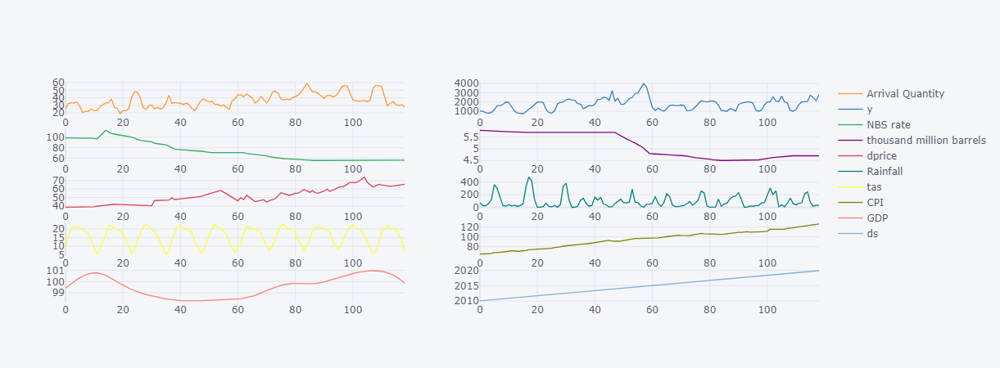

In [390]:
finaldf.iplot(subplots=True)

In [391]:
finaldf.isnull().sum()

Arrival Quantity            0
y                           0
NBS rate                    0
thousand million barrels    0
dprice                      0
Rainfall                    0
tas                         0
CPI                         0
GDP                         0
ds                          0
dtype: int64

# Checking correlations

/tmp/ipykernel_32/790613366.py:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



<Axes: >

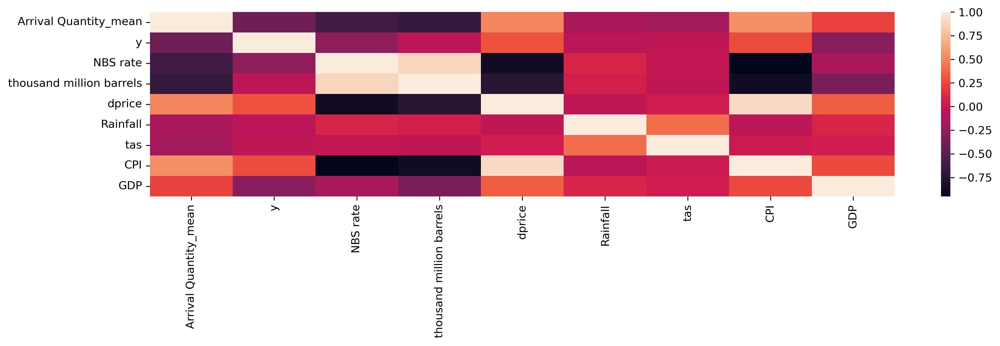

In [392]:
sns.heatmap(data=finaldf1.corr())

/tmp/ipykernel_32/2293981305.py:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



<Axes: >

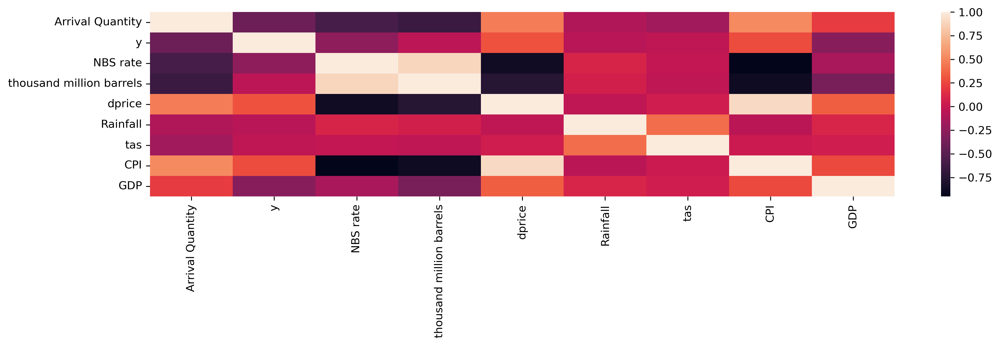

In [393]:
sns.heatmap(data=finaldf.corr())

# Dropping Diesel Reserves & CPI

In [394]:
# finaldf.drop(['thousand million barrels','CPI'],axis=1,inplace=True)
finaldf.columns

Index(['Arrival Quantity', 'y', 'NBS rate', 'dprice', 'Rainfall', 'tas', 'GDP',
       'ds'],
      dtype='object')

In [395]:
# finaldf1.drop(['thousand million barrels','CPI'],axis=1,inplace=True)
finaldf1.columns

Index(['Arrival Quantity_mean', 'y', 'NBS rate', 'dprice', 'Rainfall', 'tas',
       'GDP', 'ds'],
      dtype='object')

# Using simple prophet model

In [396]:
# splitting train and test data
trainDataSize = 0.80
splitSize = int(finaldf.shape[0]*trainDataSize)
print(splitSize)
train = finaldf[0:splitSize]
test = finaldf[splitSize:]
print(train.shape)
print(test.shape)
Columns=finaldf.columns.tolist()
Columns.remove('y')
Columns.remove('ds')
print(Columns)
prophetColumns =Columns
# model

model = Prophet()

# adding all columns in add regressor
for col in prophetColumns:
    model.add_regressor(col)
#training model
model.fit(train)

future =test.copy()
future.drop('y',axis=1,inplace=True)

#prediction
prediction = model.predict(future)

19:26:44 - cmdstanpy - INFO - Chain [1] start processing


95
(95, 8)
(24, 8)
['Arrival Quantity', 'NBS rate', 'dprice', 'Rainfall', 'tas', 'GDP']


19:26:45 - cmdstanpy - INFO - Chain [1] done processing


MAE: 226.431
MAPE: 0.12505458919780488


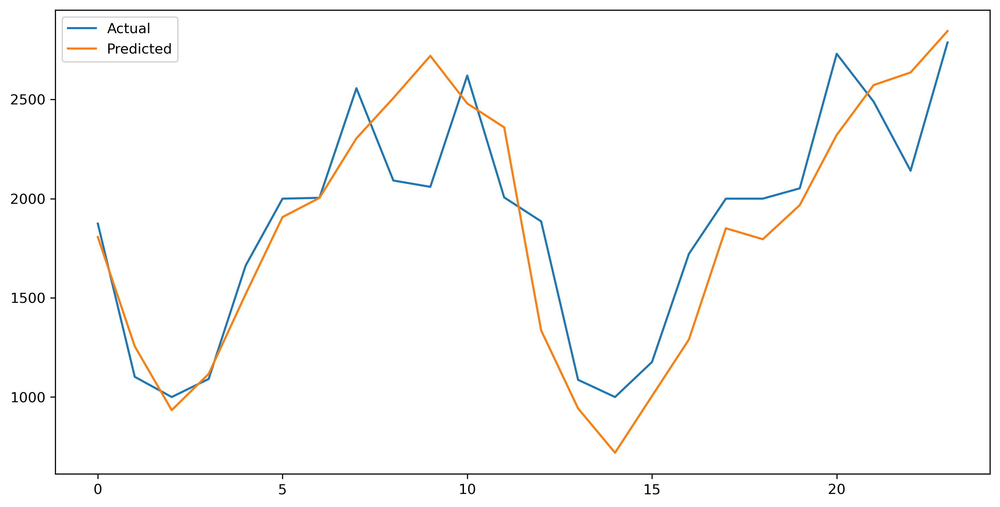

In [397]:
y_true = test['y'].values
y_pred = prediction['yhat'].values
plt.figure(figsize=(12, 6))
mae = mean_absolute_error(y_true, y_pred)
print('MAE: %.3f' % mae)
mape = mean_absolute_percentage_error(y_true, y_pred)
print("MAPE:", mape)
# plot expected vs actual
plt.plot(y_true, label='Actual')
plt.plot(y_pred, label='Predicted')
plt.legend()
plt.show()

In [398]:
# import plotly.io as pio
# pio.renderers.default = 'colab'

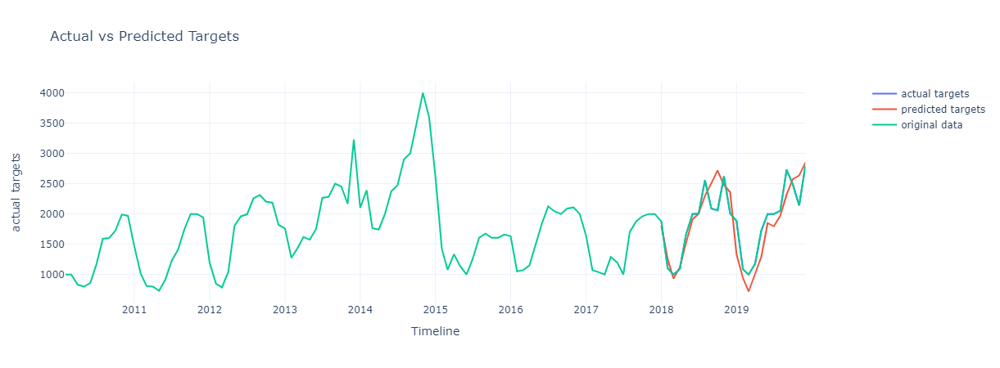

In [399]:
fig = make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(
    go.Scatter(x=test['ds'].values, y=y_true, name="actual targets"),)
    #secondary_y=False,)
fig.add_trace(
    go.Scatter(x=test['ds'].values, y=y_pred, name="predicted targets"),)
    #secondary_y=True,)
fig.add_trace(go.Scatter(x=finaldf['ds'].values, y=finaldf['y'].values, name="original data"),)
    #secondary_y=True,)
fig.update_layout(
    title_text="Actual vs Predicted Targets")
fig.update_xaxes(title_text="Timeline")
fig.update_yaxes(title_text="actual targets", secondary_y=False)
fig.update_yaxes(title_text="predicted targets", secondary_y=True)
fig.show()

# Modifying trend flexibility & amount of historical data to be included for detecting trend changepoints.

19:26:46 - cmdstanpy - INFO - Chain [1] start processing


95
(95, 8)
(24, 8)
['Arrival Quantity', 'NBS rate', 'dprice', 'Rainfall', 'tas', 'GDP']


19:26:47 - cmdstanpy - INFO - Chain [1] done processing


MAE: 219.665
MAPE: 0.12248916310445972


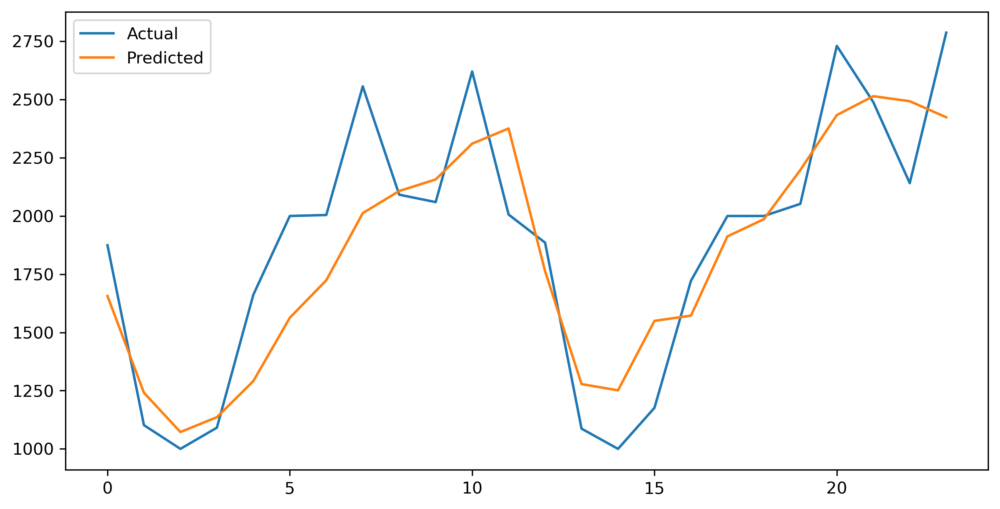

In [400]:
#Trial 2

# splitting train and test data
trainDataSize = 0.80
splitSize = int(finaldf.shape[0]*trainDataSize)
print(splitSize)
train = finaldf[0:splitSize]
test = finaldf[splitSize:]
print(train.shape)
print(test.shape)
Columns=finaldf.columns.tolist()
Columns.remove('y')
Columns.remove('ds')
print(Columns)
prophetColumns =Columns
# model

#seasonality_mode = 'multiplicative'

#modelWeekly = Prophet(changepoint_range=0.90,changepoint_prior_scale = 0.5)

model = Prophet(changepoint_range=0.95,changepoint_prior_scale = 1,)#seasonality_prior_scale=20)

# adding all columns in add regressor
for col in prophetColumns:
    model.add_regressor(col)
#training model
model.fit(train)

future =test.copy()
future.drop('y',axis=1,inplace=True)

#prediction
prediction = model.predict(future)

y_true = test['y'].values
y_pred = prediction['yhat'].values


plt.figure(figsize=(10, 5))
mae = mean_absolute_error(y_true, y_pred)
print('MAE: %.3f' % mae)
mape = mean_absolute_percentage_error(y_true, y_pred)
print("MAPE:", mape)
# plot expected vs actual
plt.plot(y_true, label='Actual')
plt.plot(y_pred, label='Predicted')
plt.legend()
plt.show()

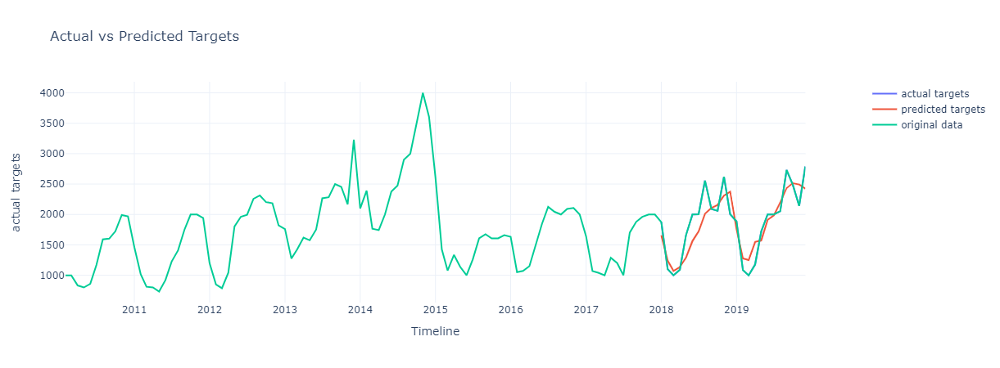

In [401]:
# with extreme weather and 80% train data, seasonality mode mulitplicative
fig = make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(
    go.Scatter(x=test['ds'].values, y=y_true, name="actual targets"),)
    #secondary_y=False,)
fig.add_trace(
    go.Scatter(x=test['ds'].values, y=y_pred, name="predicted targets"),)
    #secondary_y=True,)
fig.add_trace(go.Scatter(x=finaldf['ds'].values, y=finaldf['y'].values, name="original data"),)
    #secondary_y=True,)
fig.update_layout(
    title_text="Actual vs Predicted Targets")
fig.update_xaxes(title_text="Timeline")
fig.update_yaxes(title_text="actual targets", secondary_y=False)
fig.update_yaxes(title_text="predicted targets", secondary_y=True)
fig.show()

In [402]:
finaldf.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 119 entries, 0 to 118
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   Arrival Quantity  119 non-null    float64       
 1   y                 119 non-null    float64       
 2   NBS rate          119 non-null    float64       
 3   dprice            119 non-null    float64       
 4   Rainfall          119 non-null    float64       
 5   tas               119 non-null    float64       
 6   GDP               119 non-null    float64       
 7   ds                119 non-null    datetime64[ns]
dtypes: datetime64[ns](1), float64(7)
memory usage: 8.4 KB


# Implementing prophet model with 95% cofidence interval

In [403]:
x=finaldf1.shape[0]
a=int(x*0.95)
b=int(x*0.05)
b=-b
b

-5

In [404]:
def model_prophet(Prophetdf,n_obs= a+1):

    Prophetdf_train=Prophetdf[0:n_obs]
    Prophetdf_test =Prophetdf[n_obs:]
    multi_model = Prophet(interval_width = 0.95)
    Prophet_cols = Prophetdf.columns.tolist()
    Prophet_cols.remove('ds')
    Prophet_cols.remove('y')
    print(Prophetdf_train.columns)
    #print(Prophetdf_test[['ds','y']])

    # adding all columns in add regressor
    for col in Prophet_cols:
        multi_model.add_regressor(col)


    multi_model.fit(Prophetdf_train)
    print('Prophetdf_test.shape[0]')
    print(Prophetdf_test.shape[0])
    # make furture frame
    future = multi_model.make_future_dataframe(periods = Prophetdf_test.shape[0],freq='MS', include_history=True)
    for col in Prophet_cols:
        future[col] =Prophetdf[col]
    print(Prophetdf_test[['ds','y']])
    print('future')
    print(future)

    # predict future
    forecastProphet =  multi_model.predict(future)
    combined_df = pd.merge(Prophetdf_test[['ds','y']],forecastProphet[['ds', 'yhat', 'yhat_lower', 'yhat_upper']], on='ds')

    print(forecastProphet[['ds','yhat', 'yhat_lower','yhat_upper']].tail())

    fig1 = multi_model.plot(forecastProphet)

    Prophetdf.plot(x = 'ds', y = 'y')

    multi_model.plot_components(forecastProphet);


    #print(Prophetdf_test[['ds','y']])
    print(forecastProphet[['ds', 'yhat', 'yhat_lower', 'yhat_upper']][b:])

    combined_df = pd.merge(Prophetdf_test[['ds','y']],forecastProphet[['ds', 'yhat', 'yhat_lower', 'yhat_upper']][b:], on='ds')
    #print(combined_df.head())


    #Check MAE value
    MAE = mean_absolute_error(combined_df['y'], combined_df['yhat'])
    print('MAE')
    print(MAE)

#Check MAPE value
    MAPE = mean_absolute_percentage_error(combined_df['y'], combined_df['yhat'])
    print('MAPE')
    print(MAPE)

    import seaborn as sns
    import matplotlib.pyplot as plt
    plt.rcParams.update({'figure.figsize':  (15, 3),  'figure.dpi' : 300})
    fig, ax = plt.subplots()

    sns.lineplot(data = Prophetdf , x = 'ds', y = 'y' ,label = 'Original')
    sns.lineplot(data= forecastProphet, x = 'ds', y = 'yhat', label = 'Forecast')
    plt.grid(linestyle = '-', linewidth = 0.3)

    plt.legend(["Original","forecast"])


    import seaborn as sns
    import matplotlib.pyplot as plt

    plt.rcParams.update({'figure.figsize':  (15, 3),  'figure.dpi' : 300})
    fig, ax = plt.subplots()
    sns.lineplot(data = Prophetdf[b:] , x = 'ds', y = 'y' ,label = 'Original')
    sns.lineplot(data= forecastProphet[b:], x = 'ds', y = 'yhat', label = 'Forecast')
    plt.grid(linestyle = '-', linewidth = 0.3)
    plt.legend(["Original","forecast"])




    return MAE

In [405]:
finaldf.head()

,Arrival Quantity,y,NBS rate,dprice,Rainfall,tas,GDP,ds
0,25.000000,1000.000000,98.477,38.550835,73.3,9.1,99.41989,2010-02-01
1,32.500000,1000.000000,98.477,38.550835,25.8,16.0,99.62147,2010-03-01
2,33.500000,833.333333,98.477,38.550835,25.5,20.5,99.81792,2010-04-01
3,33.000000,800.000000,98.359,38.550835,56.6,21.7,100.00665,2010-05-01
4,34.666667,859.178886,98.241,38.550835,122.9,21.4,100.18442,2010-06-01


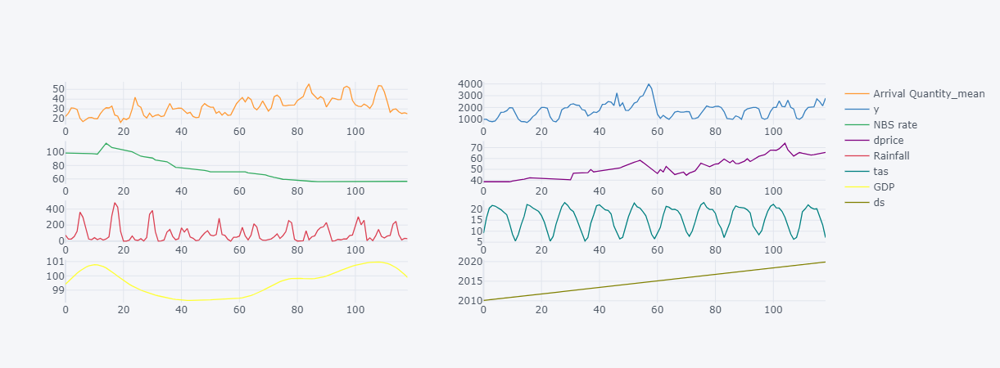

In [406]:
finaldf1.iplot(subplots=True)

In [407]:
#HERE we can see that MAE for arrival quantity mean(589.63) resampling is significantly less than that calculated using max resampling(608.94)

# For arrival (max attribute) 

19:26:49 - cmdstanpy - INFO - Chain [1] start processing
19:26:49 - cmdstanpy - INFO - Chain [1] done processing


Index(['Arrival Quantity', 'y', 'NBS rate', 'dprice', 'Rainfall', 'tas', 'GDP',
       'ds'],
      dtype='object')
Prophetdf_test.shape[0]
5
            ds            y
114 2019-08-01  2052.052786
115 2019-09-01  2730.384490
116 2019-10-01  2489.090909
117 2019-11-01  2141.019062
118 2019-12-01  2787.218964
future
            ds  Arrival Quantity  NBS rate     dprice  Rainfall        tas  \
0   2010-02-01         25.000000    98.477  38.550835      73.3   9.100000   
1   2010-03-01         32.500000    98.477  38.550835      25.8  16.000000   
2   2010-04-01         33.500000    98.477  38.550835      25.5  20.500000   
3   2010-05-01         33.000000    98.359  38.550835      56.6  21.700000   
4   2010-06-01         34.666667    98.241  38.550835     122.9  21.400000   
..         ...               ...       ...        ...       ...        ...   
114 2019-08-01         35.000000    56.365  63.505313     246.3  20.100000   
115 2019-09-01         31.000000    56.365  63.949166      

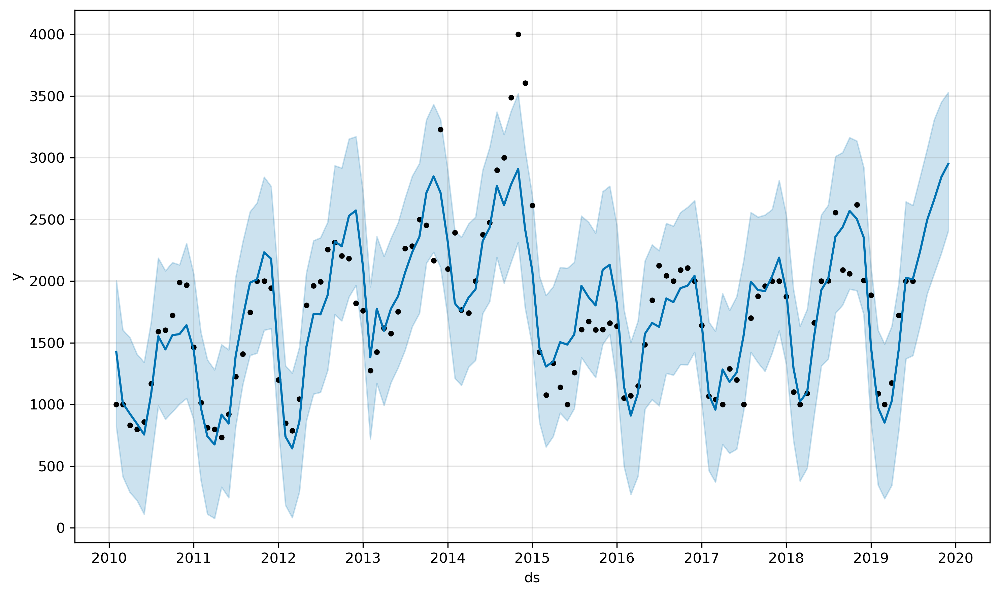

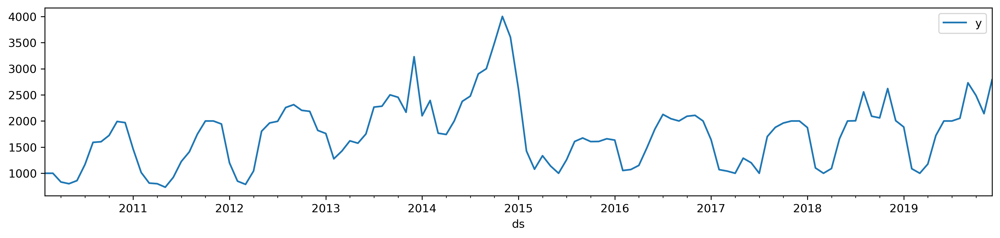

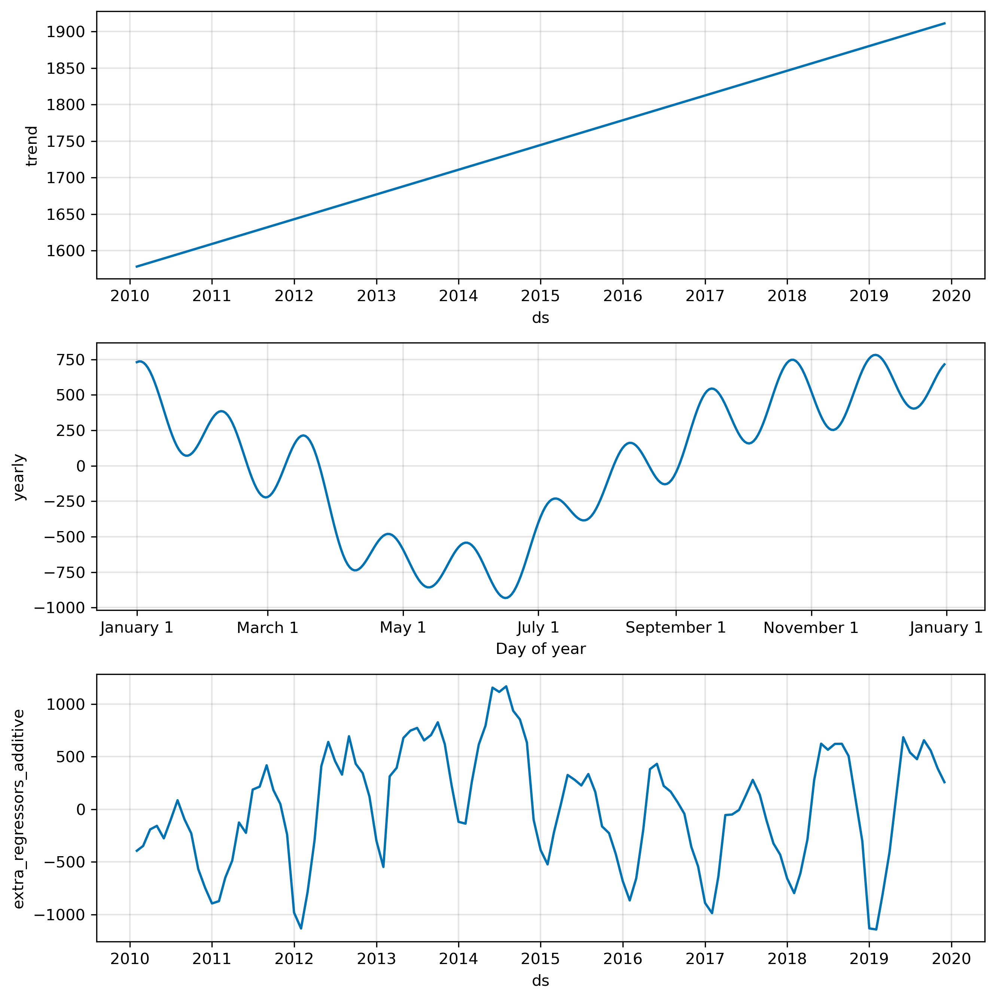

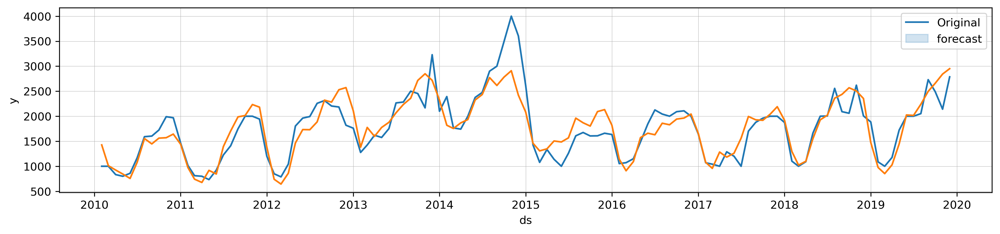

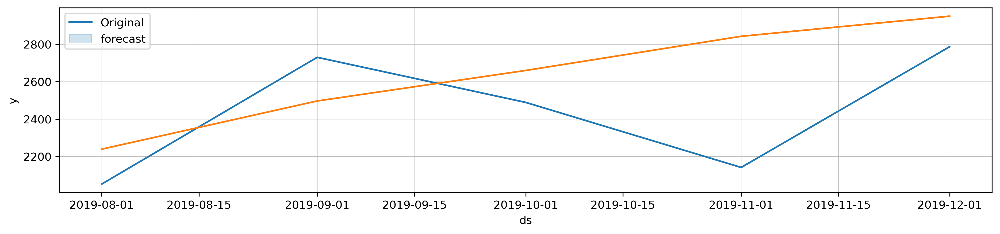

In [408]:
MAE_Prophet = model_prophet(finaldf)

# For arrival (mean attribute) 

19:26:55 - cmdstanpy - INFO - Chain [1] start processing
19:26:55 - cmdstanpy - INFO - Chain [1] done processing


Index(['Arrival Quantity_mean', 'y', 'NBS rate', 'dprice', 'Rainfall', 'tas',
       'GDP', 'ds'],
      dtype='object')
Prophetdf_test.shape[0]
5
            ds            y
114 2019-08-01  2052.052786
115 2019-09-01  2730.384490
116 2019-10-01  2489.090909
117 2019-11-01  2141.019062
118 2019-12-01  2787.218964
future
            ds  Arrival Quantity_mean  NBS rate     dprice  Rainfall  \
0   2010-02-01              22.354167    98.477  38.550835      73.3   
1   2010-03-01              25.722222    98.477  38.550835      25.8   
2   2010-04-01              31.050000    98.477  38.550835      25.5   
3   2010-05-01              30.790323    98.359  38.550835      56.6   
4   2010-06-01              29.349462    98.241  38.550835     122.9   
..         ...                    ...       ...        ...       ...   
114 2019-08-01              30.026882    56.365  63.505313     246.3   
115 2019-09-01              27.005376    56.365  63.949166      78.7   
116 2019-10-01              25

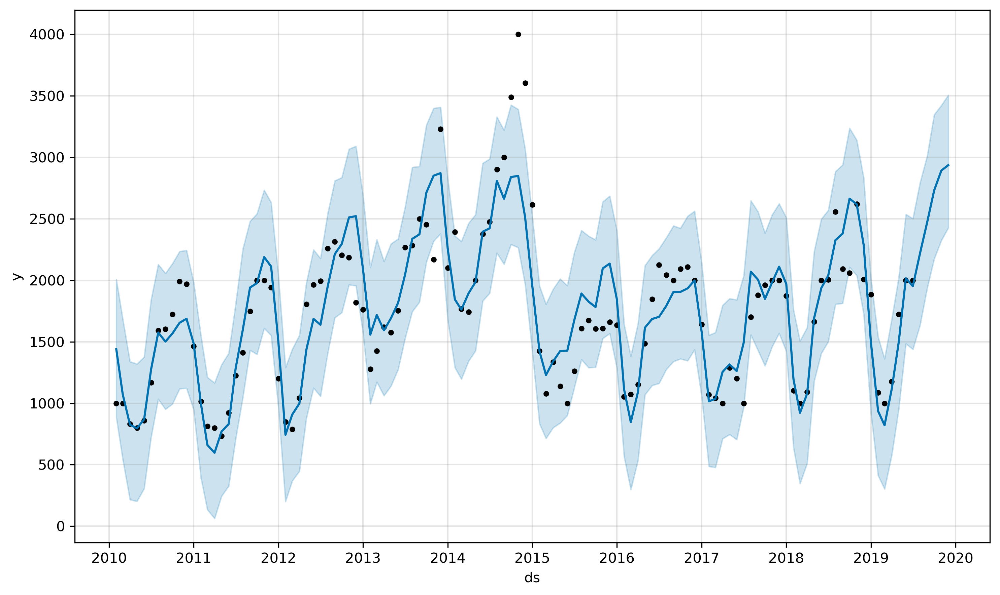

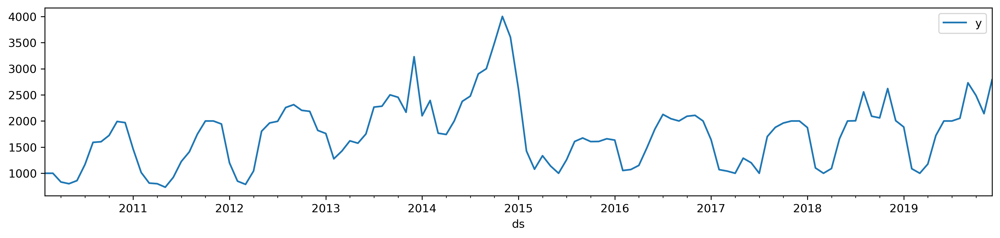

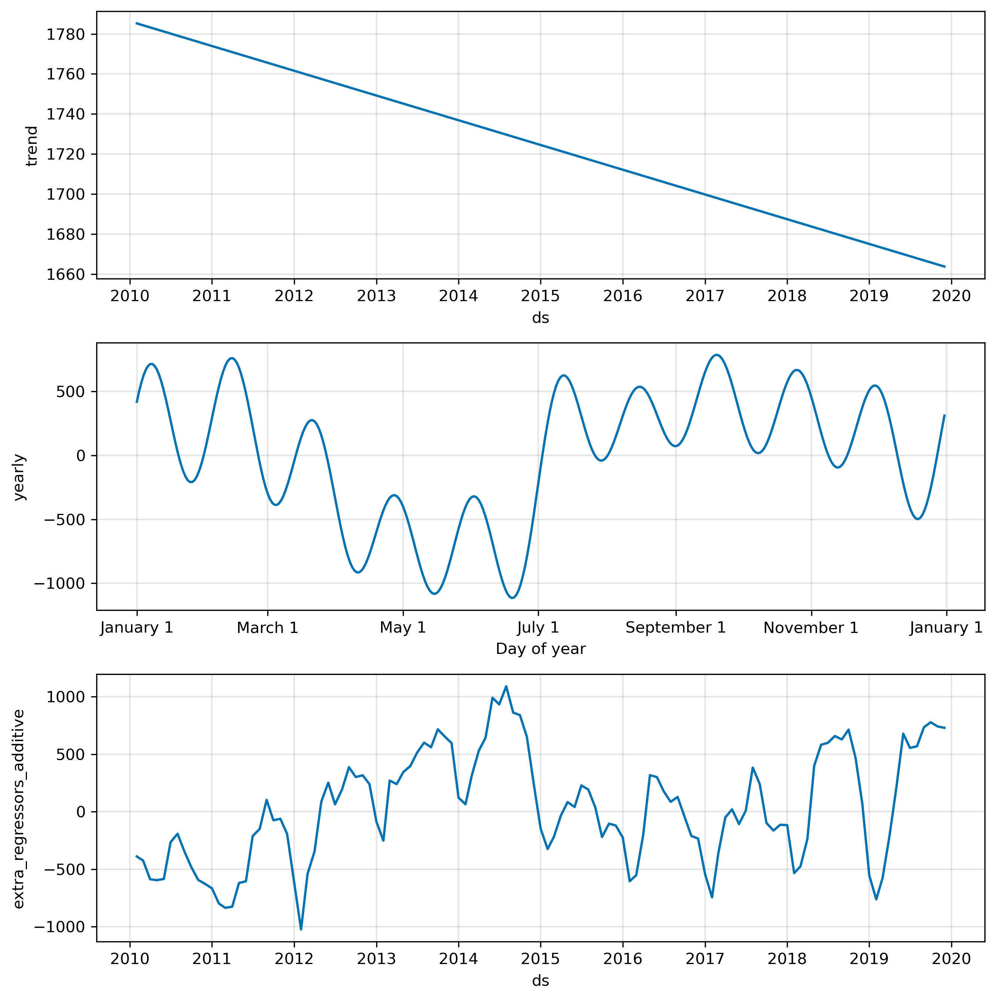

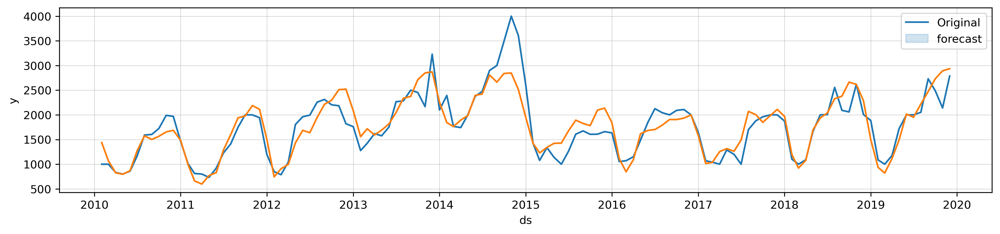

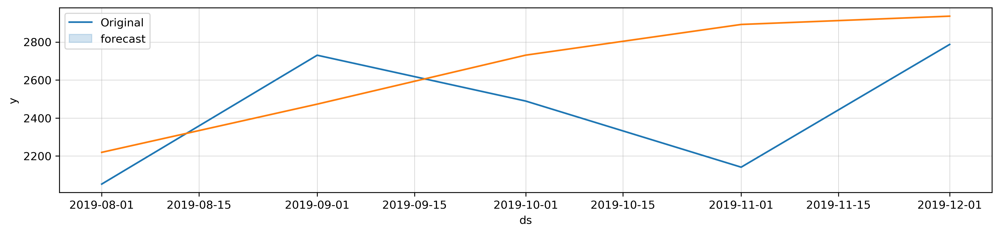

In [409]:
MAE_Prophet_1=model_prophet(finaldf1)